In [ ]:
#from google.colab import drive
#drive.mount("/content/gdrive", force_remount=True)

In [ ]:
#!pip install kaggle

In [ ]:
#%cd /content/gdrive/MyDrive/Colab Notebooks/Dog vision/

In [ ]:
#import os
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Colab Notebooks/Dog vision/"

In [ ]:
#!kaggle competitions download -c dog-breed-identification

In [ ]:
#ls

In [ ]:
#!unzip \*.zip

# 🐕 End-to-end multiclass Dog-Breed classification

This notebook builds an end to end multiclass image classifier using
Tensor Flow 2.0 and Tensor Flow hub.

## 1. Problem

Identifying the breed of a dog given it's image.

When I'm sitting at a cafe and I take a photo of a dog, I want
to know what breed of dog it is.

## 2. Data

The data used here is from the Kaggle's dog-breed-identification
competition dataset.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed
of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data), so it is best to use
Deep learning/Transfer learning.
* There are 120 breeds of dogs, meaning there are 120 different classes.
* There are around 10,000+ images in the training set.
(These images have labels)
* There are around 10,000+ images in the test set.
(These images have no labels, as we will be predicting them)


### Get our workspace ready
* import tensorflow 2.x ✅
* import tensorflow hub ✅
* Make sure we're using a GPU ✅

In [ ]:
#import the necessary tools
#import tensor flow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("hub version:", hub.__version__)

#check for GPU availability
print("GPU", "avalilable (YESS :D)" if tf.config.list_physical_devices("GPU")
 else "not avaliable :( ")



TF version: 2.15.0
hub version: 0.16.1
GPU avalilable (YESS :D)


## Getting our data ready (turning it into tensors)
With all the ml models, our data has to be in numerical format.

In [ ]:
#check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


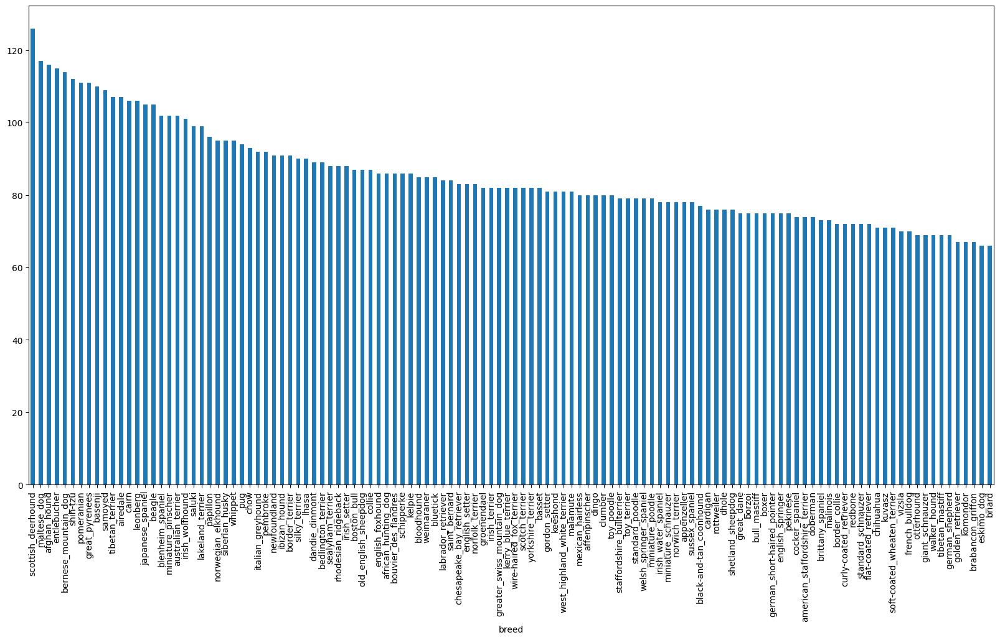

In [ ]:
#how many images are there of each breed?
labels_csv["breed"].value_counts().plot(kind= "bar", figsize = (20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

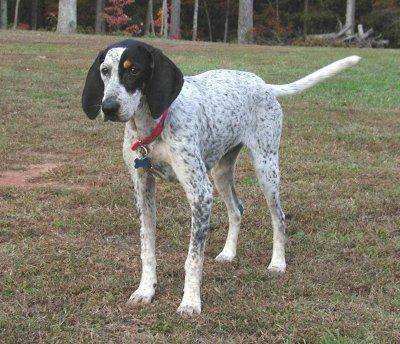

In [ ]:
#let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

## Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pathnames for image id's
filenames = ["drive/MyDrive/Colab Notebooks/Dog vision/train/" + fname + ".jpg" for fname  in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

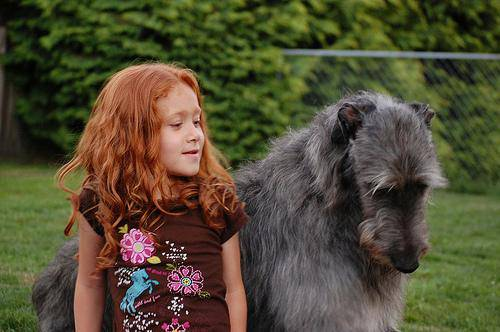

In [ ]:
Image("drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg")

In [ ]:
#check whether the number of filenames match actual images
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog vision/train"))==len(filenames):
  print("filenames match the actual amount of files!!! Proceed.")
else:
  print("The filenames do not match the actual amount of files T-T, check the target directory.")


filenames match the actual amount of files!!! Proceed.


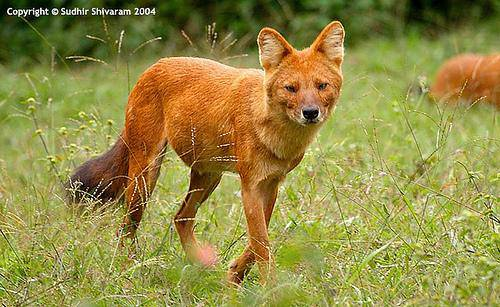

In [ ]:
#one more check
Image(filenames[1800])

In [ ]:
labels_csv["breed"][1800]

'dhole'

Since we've got our training image filepaths in a list, let's prepare the labels.

In [ ]:
import numpy as np
#turning our breeds into arrays
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#check if the number of labels matches the number of filenames
#basically checking if there is any missing data in the unstructured data
if len(labels) == len(filenames):
  print("The number of labels matches the number of filenames!")
else:
  print("The number of labels does not match the number of filenames, check the data directory")

The number of labels matches the number of filenames!


In [ ]:
#find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turning every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#example : turning boolean array into integers
print(labels[0]) #the original label
print(np.where(unique_breeds == labels[0] )) #check the location of the label
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[4])
print(boolean_labels[4].astype(int))

golden_retriever
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validation set.
Since the dataset from kaggle doesn't come with a validation set,
we will create our own validation data set.

In [ ]:
#setup x and y variables
x = filenames
y = boolean_labels

## Start experimentation with: ~1000 images and increase as needed.

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [ ]:
#Split the data into train and validation sets
from sklearn.model_selection import train_test_split

#split them into training and validation sets with a total size of NUM_IMAGES
x_train, x_valid, y_train, y_valid = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size = 0.2,
                                                      random_state = 42)

len(x_train), len(x_valid), len(y_train), len(y_valid)

(800, 200, 800, 200)

In [ ]:
x_train[:3], y_train[:3]

(['drive/MyDrive/Colab Notebooks/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fal

## Preprocessing Images (Turning the images into tensors)

Tp preprocess our images into tensors we'll define a function which does a few things :
1. Take an image filepath as input
2. Use tensor flow to read the file and save it to a variable 'image'.
3. Turn our 'image' (jpg) into Tensors.
4. Normalize our 'image' (convert the color channel values of 0-255 to 0-1).
5. Resize the 'image' to be of size (224,224).
6. Return the modified 'image'.


# Before we do that, let's see what importing an image looks like.

In [ ]:
#convert image to numpy array
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max() , image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#turn the image to tensors
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
#define the image size
IMG_SIZE = 224

#define a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes the image filepath and turns the image into a Tensor.
  """
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpg image into a numerical tensor with three color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  #Convert the color channel values from 0-255 to 0-1 (Normalization - scaling)
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into Batches.

Q. Why turn the data into batches?

A- Let's say you are trying to process 10,000+ images in one go.. they all might not fit into memory.
So that's why we do about 32 (this is the batch size) images at a time.
(You can change the batch size manually if needed.)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this : (image,label).

In [ ]:
#create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes the image file path name and the associated label, processes
  the image and then returns it in the form of a tuple (image,label).
  """
  image = process_image(image_path)
  return image,label


In [ ]:
#demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## Now we've got a way to turn our data into tuples of Tensors in the form : 'image,label'. Let's define a function to turn all of our data (x,y) into batches.

In [ ]:
#define the batch size, 32 is usually a good number to start with.
BATCH_SIZE = 32

#create a function to turn all the data into batches
def create_data_batches(x,y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (x) and labels (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle the data if it is
  a validation set.
  Also accepts test_data as input (NO LABELS).

  """
  #if the data is a test_data we don't have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid_dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  #filepath
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches.....")
    #turn the filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    #shuffling the filepaths and labels before mapping the image processor function is faster than shuffling the images.
    data = data.shuffle(buffer_size = len(x))
    #create (image,label) tuples (this also turns the image path into preprocessed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch


In [ ]:
#creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
valid_data = create_data_batches(x_valid, y_valid, valid_data= True)

Creating training data batches.....
Creating validation data batches...


In [ ]:
#check out the different elements of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is no win batches, however these can be a little hard to understand/comprehend, so let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

#let's define a fucntion for viewing the images in the data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from the data batch
  """
  #setup the figure
  plt.figure(figsize=(10,10))

  #loop through 25(for displaying 25 images)
  for i in range(25):
    #Create subplots in rows (5 rows,5 columns)
    ax = plt.subplot(5,5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

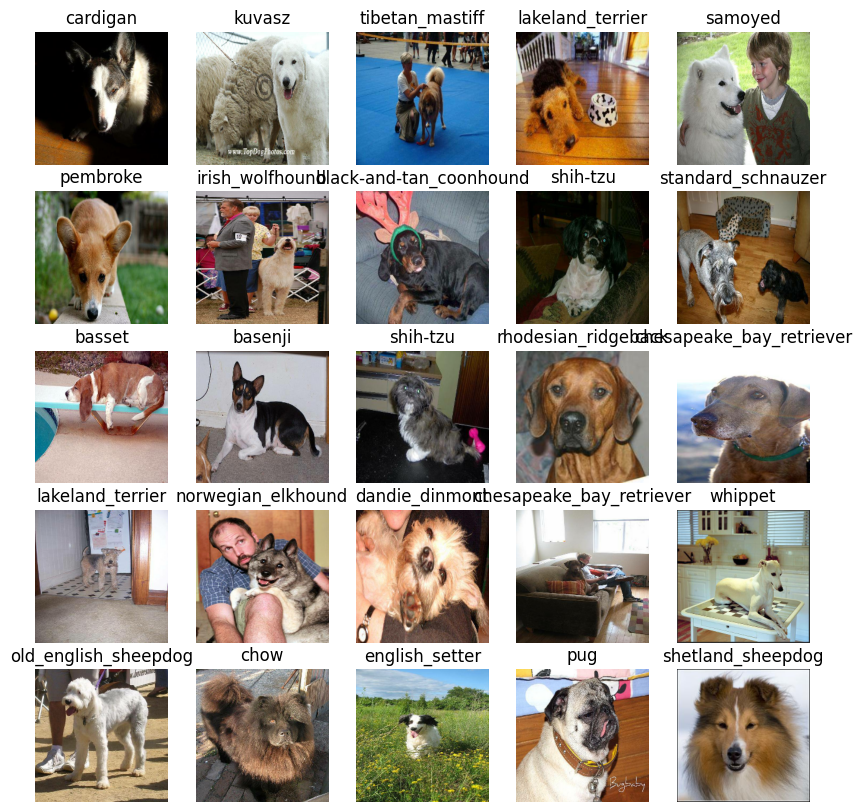

In [ ]:
#Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

In [ ]:
#Now let's visualize the validation set
valid_images, valid_labels = next(valid_data.as_numpy_iterator())

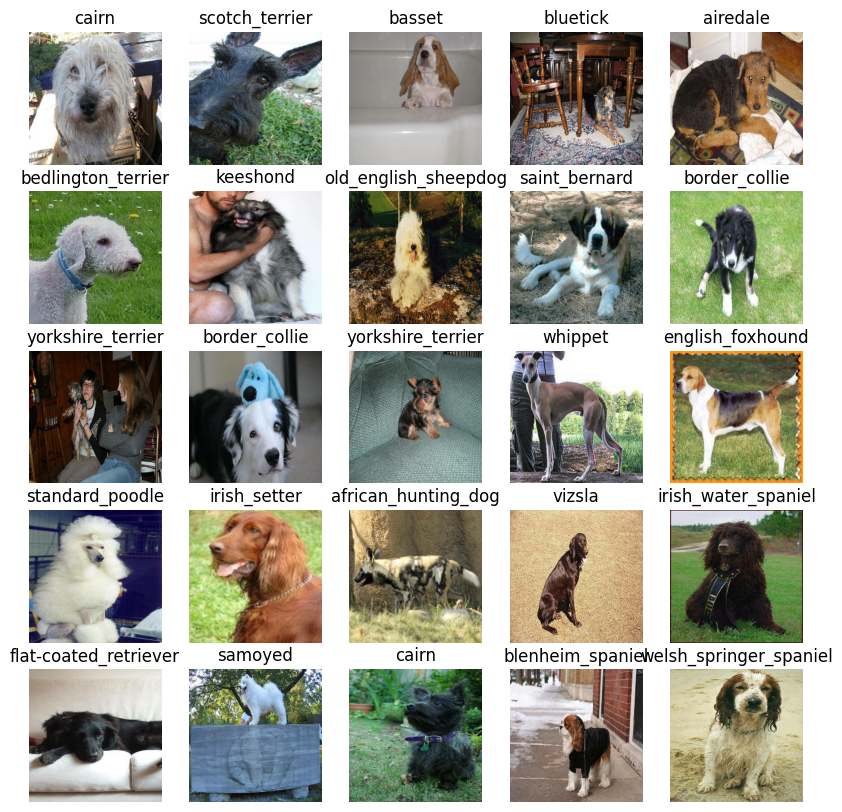

In [ ]:
show_25_images(valid_images, valid_labels)

## Building a model
Before we build our model, there are few things we need to define :
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (our image labels shape, in the fotm of tensors) of our model.
* The URL of the model that we want to use.

In [ ]:
#setup input shape to our model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, Let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in a sequential fashion.
(step by step process).
* Compiles the model. (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for tensor board which helps track our models progress and another for early stopping which prevents our model for training too long.

### TensorBoard Callback

To setup a tensorboard callback we need to do three things:
1. Load the tensorboard notebook extension. ✅
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's 'fit()' function. ✅
3. Visualize our models training logs with the help of '%tensorboard' magic function. (we'll do this after model training).✅

In [ ]:
#load the tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorboard logs
  log_dir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog vision/logs",
                         #make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("Y%m$d-H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

### Early stopping callback
Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data).

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains our model.

* Create a model using 'create_model()'.
* setup a tensorboard callback using 'create_tensorboard_callback()'.
* Call the 'fit()' function on our model passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS'), and the callbacks we'd like to use.
* Return the model.

In [ ]:
#build a function to train a model and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #create a model
  model = create_model()
  #create a new tensorboard session everytime we train a new model
  tensorboard = create_tensorboard_callback()
  #fit the model to the data passing it the callbacks we created.
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq=1,
            callbacks =[tensorboard,early_stopping])
  #return the fitted model
  return model



In [ ]:
#fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 222s 7s/step - loss: 4.5455 - accuracy: 0.1000 - val_loss: 3.3350 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 141ms/step - loss: 1.6325 - accuracy: 0.6850 - val_loss: 2.1084 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 6s 219ms/step - loss: 0.5632 - accuracy: 0.9337 - val_loss: 1.6476 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 143ms/step - loss: 0.2488 - accuracy: 0.9862 - val_loss: 1.4399 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 4s 164ms/step - loss: 0.1453 - accuracy: 0.9975 - val_loss: 1.3847 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 202ms/step - loss: 0.0996 - accuracy: 1.0000 - val_loss: 1.3434 - val_accuracy: 0.6600
Epoc

### Checking the tensorboard logs

The tensorboard magic function ('%tensoboard') will access the logs directory we created and visualize it's contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose =1)
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.4137523e-03, 1.4941217e-04, 1.5150680e-03, ..., 1.4992094e-03,
        1.2335877e-05, 2.5015734e-03],
       [8.8193966e-04, 3.6557406e-04, 2.0069437e-02, ..., 5.6345012e-05,
        1.3668003e-03, 1.3863813e-04],
       [2.5484314e-06, 1.1745832e-04, 8.5982712e-05, ..., 5.3506894e-05,
        9.8712735e-06, 1.5363785e-04],
       ...,
       [3.7537459e-06, 2.9290491e-06, 3.7089503e-05, ..., 1.1228396e-05,
        2.9186609e-05, 8.8091183e-06],
       [2.5056829e-03, 4.7310492e-05, 5.2697596e-05, ..., 2.2049474e-04,
        3.6181534e-06, 1.0697569e-02],
       [2.6594535e-05, 1.4773882e-05, 2.4787273e-04, ..., 3.4840221e-03,
        4.1329069e-04, 2.3500435e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
#first prediction
index = 113
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]} ")

[1.49655517e-03 9.94807924e-05 1.92686595e-04 2.33219936e-04
 5.90765243e-03 3.44668370e-05 7.00893719e-03 3.65586020e-04
 2.94409430e-04 8.34274470e-05 1.43066936e-04 2.32518840e-04
 1.62687420e-03 4.20130556e-04 1.61382137e-04 9.88347922e-04
 6.20153651e-06 3.71682458e-02 1.86685138e-05 8.32008445e-05
 1.15409865e-04 1.42311153e-04 6.56602351e-05 4.65542253e-04
 1.30518666e-03 4.89889089e-06 1.21853582e-03 5.36336775e-05
 2.11688617e-04 3.59840598e-03 1.13922455e-04 3.95026145e-04
 5.07270510e-04 1.43763915e-04 8.86127527e-04 7.71889240e-02
 1.43743300e-05 1.22111372e-03 2.15034626e-04 1.34594433e-04
 5.21063885e-05 6.70461577e-06 2.02118263e-05 1.02008657e-04
 9.83420687e-05 2.33837301e-04 2.04686548e-05 3.34192118e-05
 9.90947592e-05 9.59746074e-03 3.72865907e-05 3.30506795e-04
 7.79073089e-05 2.25764979e-05 4.43507655e-04 8.85291738e-05
 4.98333429e-05 5.92381833e-03 1.76388159e-04 3.12502583e-04
 2.54191866e-04 5.58909123e-05 8.30032659e-05 5.47139731e-04
 4.08507913e-04 3.897812

Having the above functionality is great, but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**NOTE** - Prediction probabilities are also known as confidence levels.

In [ ]:
#Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[100])
pred_label

'bloodhound'

Now since our validation data is still in batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those images to the validation labels (truth labels).

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a function to unbatch the batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,labels) tensors and returns it as separate
  arrays of images and labels.
  """
  images =[]
  labels =[]

  #loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#unbatchify the validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make all these a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label,image = prediction_probabilities[n], labels[n], images[n]

  #get the pred label
  pred_label = get_pred_label(pred_prob)

  #plot image and remove the ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color ="green"
  else:
    color = "red"

  #change the plot title to be predicted, probability of prediction and truth label.
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)


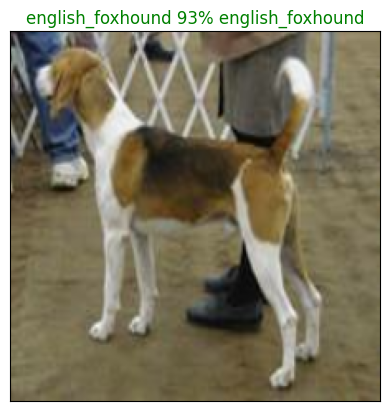

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=valid_labels, images=
          valid_images, n=90)

Now we've got a function to visualize our model's top predictions, let's create a function to view our modells top 10 predictions.

This function will:
1. Take an input of prediction probabilities array, a ground truth array and an integer array. ✅
2. find the prediction using 'get_pred_label()'. ✅
3. Find the top 10:
  * Prediction probabilty indexes ✅
  * Prediction probability values ✅
  * Prediction labels ✅
4. Plot the top 10 prediction probability values and labels, colouring the true label green. ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for
  sample 10.
  """
  pred_prob, true_label = prediction_probabilities[n],  labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #setup the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "purple")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation ="vertical")

  #change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels ==true_label)].set_color("green")
  else:
    pass

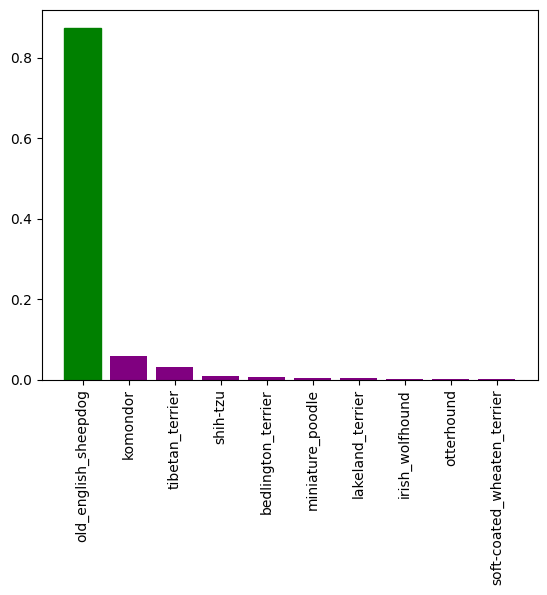

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels =valid_labels,
               n=7)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

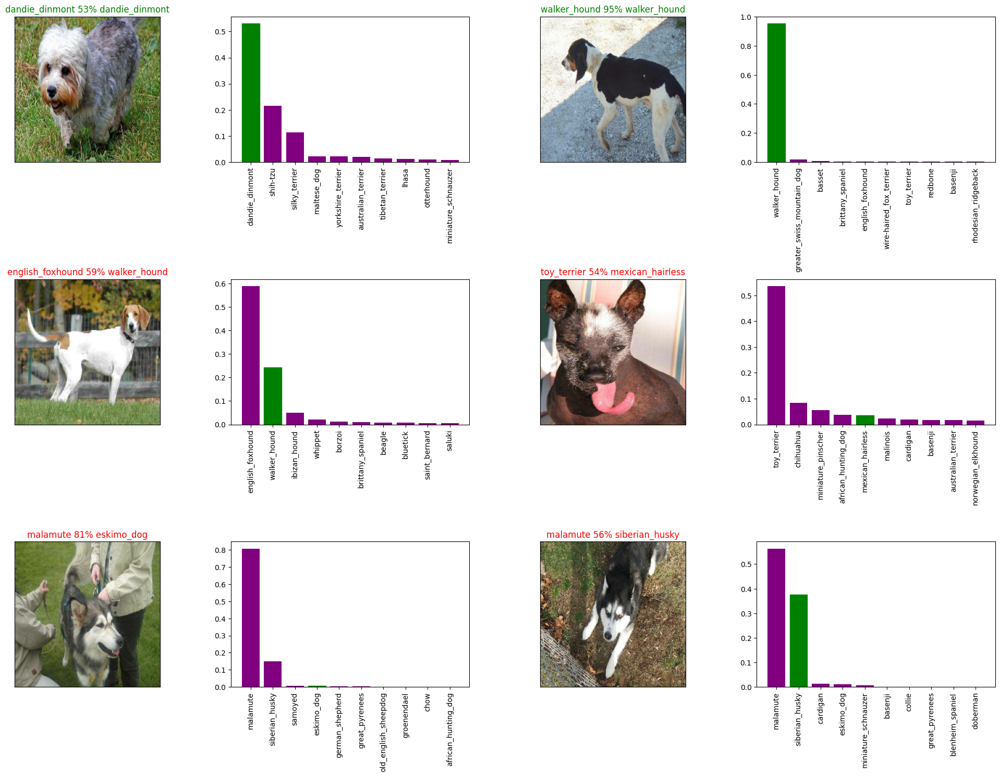

In [ ]:
#Let's check out a few predictions and their values
i_multiplier = 30
num_rows = 3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize =(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels =valid_labels,
            images =valid_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=valid_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
#create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  #create a model directory pathaname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog vision/models",
                              datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + '-' + suffix + '.h5' #save format of the model
  print(f"saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model



Now we've got functions to save and load a model, let's make sure that they work.

In [ ]:
#save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

saving model to: drive/MyDrive/Colab Notebooks/Dog vision/models/20240515-14261715783175-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab Notebooks/Dog vision/models/20240515-14261715783175-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#loading a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Colab Notebooks/Dog vision/models/20240429-15561714406218-1000-images-mobilenetv2-Adam.h5")

loading a saved model from: drive/MyDrive/Colab Notebooks/Dog vision/models/20240429-15561714406218-1000-images-mobilenetv2-Adam.h5


In [ ]:
#evaluate the pre saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.1983 - accuracy: 0.7000


[1.19832181930542, 0.699999988079071]

In [ ]:
#evaluate the loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 147ms/step - loss: 1.2807 - accuracy: 0.6750


[1.2806766033172607, 0.675000011920929]

## Training a big dog model 🐕(on the full data)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
#create a data batch with the full data
full_data = create_data_batches(x,y)

Creating training data batches.....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model for the full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
#create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor ="accuracy",
                                                             patience =3)

In [ ]:
#fit the full model to the full data
#full_model.fit(x= full_data,
              # epochs = NUM_EPOCHS,
               #callbacks =[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-model-mobilenetv2-Adam")

saving model to: drive/MyDrive/Colab Notebooks/Dog vision/models/20240515-14261715783183-full-model-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog vision/models/20240515-14261715783183-full-model-mobilenetv2-Adam.h5'

In [ ]:
#load in the full model
loaded_full_model = load_model("drive/MyDrive/Colab Notebooks/Dog vision/models/20240429-16381714408715-full-model-mobilenetv2-Adam.h5")

loading a saved model from: drive/MyDrive/Colab Notebooks/Dog vision/models/20240429-16381714408715-full-model-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily, we created 'create_data_batches()' earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on the test data we'll:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True' (since the test data doesn't have any labels).
* Make a predictions array by passing the test batches to the 'predict()' method called on our model.

In [ ]:
#load the test image filenames
test_path = "drive/MyDrive/Colab Notebooks/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/test/dd7867245d5c104fffb5afe027e41cd1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e138d8e5745db1213cc08131e7420c7a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/ddf48fc0d3f0719c40332708c331a9ab.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e0e47873420b2ed420e920a74c663233.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/df621265607ba0285bd79705eb3541e0.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e6ec1891d8f52a13683c73cabd3045cb.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e42e9ceb31ec428968e88b556a92e858.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#creating test data batches
test_data = create_data_batches(test_filenames,test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions on the test data using the loaded_full_model
#test_predictions = loaded_full_model.predict(test_data,
                                             #verbose =1)

In [ ]:
#save predictions(numpy array) to a csv file
#np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv",test_predictions,
             #delimiter =",")

In [ ]:
#load predictions from the csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv",
                              delimiter =",")

In [ ]:
test_predictions[:10]

array([[7.88029475e-10, 3.08189296e-09, 1.22199193e-08, ...,
        2.39915088e-09, 1.04188878e-07, 1.20103838e-08],
       [1.30980379e-10, 1.04413567e-09, 1.38465600e-10, ...,
        1.08314746e-10, 1.81702364e-09, 7.51627908e-07],
       [3.88347920e-15, 3.12414076e-13, 2.66009808e-15, ...,
        8.96471265e-12, 3.76468306e-13, 2.01012396e-15],
       ...,
       [1.12729849e-05, 1.35678519e-07, 2.98162455e-08, ...,
        2.94866425e-08, 1.19380775e-06, 1.13267856e-06],
       [3.92480137e-09, 2.55236131e-07, 8.89966933e-10, ...,
        3.57332377e-04, 1.81765299e-05, 8.72862049e-09],
       [6.21758534e-10, 1.96876491e-11, 7.78903816e-11, ...,
        2.89498917e-06, 1.07926699e-12, 3.52052582e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing the test dataset predictions for kaggle

To get the data in the format that kaggle needs, we'll:
* Create a pandas dataframe with an id column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the dataframe as a CSV to submit it to kaggle.

In [ ]:
#create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#append test image id's to predictions dataframe
test_ids = [os.path.splitext(path)[0]for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7867245d5c104fffb5afe027e41cd1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e138d8e5745db1213cc08131e7420c7a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ddf48fc0d3f0719c40332708c331a9ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0e47873420b2ed420e920a74c663233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7867245d5c104fffb5afe027e41cd1,7.880295e-10,3.081893e-09,1.221992e-08,4.882317e-06,2.016022e-09,3.805018e-10,7.386156e-09,2.167802e-10,3.403227e-09,...,3.725982e-06,7.144739e-08,1.157081e-05,2.426995e-10,1.695867e-05,2.910912e-09,1.983522e-09,2.399151e-09,1.041889e-07,1.201038e-08
1,e138d8e5745db1213cc08131e7420c7a,1.309804e-10,1.044136e-09,1.384656e-10,7.128493e-08,4.321304e-10,2.016174e-13,5.204644e-06,1.727107e-08,5.387043e-11,...,5.554692e-09,1.409567e-08,5.947763e-10,1.694498e-10,2.862052e-11,2.778636e-10,4.929555e-09,1.083147e-10,1.817024e-09,7.516279e-07
2,e7fcdf9671a6593b638cbee42842f981,3.883479e-15,3.124141e-13,2.660098e-15,7.424013e-13,4.620370e-13,7.651296e-13,2.182279e-13,1.679200e-13,3.030676e-11,...,2.574913e-16,6.151595e-15,7.455447e-16,6.777577e-12,8.470815e-16,1.000000e+00,4.540841e-13,8.964713e-12,3.764683e-13,2.010124e-15
3,ddf48fc0d3f0719c40332708c331a9ab,7.377123e-06,1.274146e-07,1.438490e-08,3.331678e-08,1.005173e-06,6.708470e-10,2.004310e-07,4.640900e-08,2.391595e-05,...,8.503743e-05,2.404412e-09,2.593765e-07,3.429133e-08,3.615556e-07,1.099585e-08,8.824239e-04,1.665308e-07,3.045017e-08,8.942107e-08
4,e0e47873420b2ed420e920a74c663233,3.559453e-14,3.108906e-10,3.224142e-14,1.104541e-13,7.525736e-11,1.983111e-14,6.709317e-14,1.100066e-14,1.109933e-13,...,3.906266e-15,4.399844e-13,7.634187e-13,9.063687e-11,8.207075e-11,1.178080e-14,4.043425e-14,2.680491e-13,1.180944e-18,3.236718e-14


In [ ]:
#save our predictions dataframe to csv file for submissions in kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index =False)

## Making predictions on custom images

To make predictions on custom images we'll :
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'.
And since our custom images won't have labels, we will set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our midels 'predict()' method.
* Convert the prediction output probabilities into predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
#get custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/Dog vision/my-dog/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/Dog vision/my-dog/5eb3c99c-621f-46ad-9441-807f60f077bf.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/my-dog/f5934faa-182e-4c36-b82e-7f2eb7b2dac5.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/my-dog/ec01e7e1-5ca7-4a0a-9156-7feddc0b759e.jpg']

In [ ]:
#turn the custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 849ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
#get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i])for i in range(len(custom_preds))]
custom_pred_labels

['miniature_pinscher', 'labrador_retriever', 'great_pyrenees']

In [ ]:
#get custom images(our 'unbatchify()' function won't work as there are no labels)
custom_images = []
#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

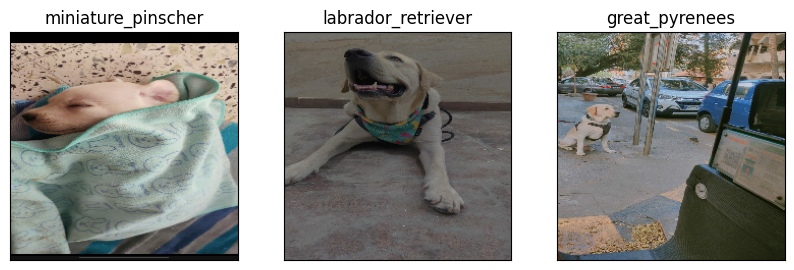

In [ ]:
#check custom image predictions
plt.figure(figsize =(10,8))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)